<a href="https://colab.research.google.com/github/burning-river/epithelium_segmentation/blob/main/train_unet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
os.chdir('/content/drive/MyDrive/dl_tutorial/epithelium/epi')

In [4]:
dataname="epistroma"
gpuid=0

# --- unet params
n_classes= 2    # Class 1: epistroma cells, Class 0: background
in_channels= 3  #input channel of the data, RGB = 3
padding= True   #should levels be padded
depth= 5       #depth of the network 
wf= 2           #wf (int): number of filters in the first layer is 2**wf
up_mode= 'upconv' #should we simply upsample the mask, or should we try and learn an interpolation 
batch_norm = True #should we use batch normalization between the layers

# --- training params
batch_size=5
patch_size=256
num_epochs = 100
phases = ["train","val"] #how many phases did we create databases for?
validation_phases= ["val"] #when should we do valiation? note that validation is time consuming, so as opposed to doing for both training and validation, we do it only for vlaidation at the end of the epoch


In [5]:
!pip install tensorboardX

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms

import sklearn.feature_extraction.image

from unet import UNet #code borrowed from https://github.com/jvanvugt/pytorch-unet

import PIL
import matplotlib.pyplot as plt
import cv2

import numpy as np
import sys, glob

from tensorboardX import SummaryWriter

import scipy.ndimage 

import time
import math
import tables

import random
from matplotlib.figure import Figure

from sklearn.metrics import confusion_matrix
import regex as re

In [7]:
#helper function for pretty printing of current time and remaining time
def asMinutes(s):
    m = math.floor(s / 60)
    s -= m * 60
    return '%dm %ds' % (m, s)
def timeSince(since, percent):
    now = time.time()
    s = now - since
    es = s / (percent+.00001)
    rs = es - s
    return '%s (- %s)' % (asMinutes(s), asMinutes(rs))

In [8]:
#specify if we should use a GPU (cuda) or only the CPU
if(torch.cuda.is_available()):
    print(torch.cuda.get_device_properties(gpuid))
    torch.cuda.set_device(gpuid)
    device = torch.device(f'cuda:{gpuid}')
else:
    device = torch.device(f'cpu')

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [9]:
#build the model according to the paramters specified above and copy it to the GPU. finally print out the number of trainable parameters
model = UNet(n_classes=n_classes, in_channels=in_channels, padding=padding,depth=depth,wf=wf, up_mode=up_mode, batch_norm=batch_norm).to(device)
print(f"total params: \t{sum([np.prod(p.size()) for p in model.parameters()])}")

total params: 	122466


In [10]:
class Dataset:
    def __init__(self, fname ,img_transform=None, mask_transform = None):
        self.fname=fname
        
        self.img_transform=img_transform
        self.mask_transform = mask_transform
        
        t=tables.open_file(self.fname)
        self.numpixels=t.root.numpixels[:]
        self.nitems=t.root.img.shape[0]
        t.close()

        self.img = None
        self.mask = None

    def __getitem__(self, index):
        with tables.open_file(self.fname,'r') as db:
            self.img=db.root.img
            self.mask=db.root.mask
       
            #get the requested image and mask from the pytable
            img = self.img[index,:,:,:]
            mask = self.mask[index,:,:]
                
        mask = mask[:,:,None].repeat(3,axis=2) #in order to use the transformations given by torchvision
        
        img_new = img
        mask_new = mask
        
        seed = random.randrange(sys.maxsize) #get a random seed so that we can reproducibly do the transformations
        if self.img_transform is not None:
            torch.manual_seed(seed)
            img_new = self.img_transform(img)

        if self.mask_transform is not None:
            torch.manual_seed(seed)
            mask_new = self.mask_transform(mask)
            mask_new = np.asarray(mask_new)[:,:,0].squeeze()
            
        return img_new, mask_new

    def __len__(self):
        return self.nitems

In [11]:
img_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomVerticalFlip(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(size=(patch_size,patch_size),pad_if_needed=True), #these need to be in a reproducible order, first affine transforms and then color
    transforms.RandomResizedCrop(size=patch_size),
    transforms.RandomRotation(180),
    transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=.5),
    transforms.RandomGrayscale(),
    transforms.ToTensor()
    ])


mask_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomVerticalFlip(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(size=(patch_size,patch_size),pad_if_needed=True), #these need to be in a reproducible order, first affine transforms and then color
    transforms.RandomResizedCrop(size=patch_size,interpolation=PIL.Image.NEAREST),
    transforms.RandomRotation(180),
    ])

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:892: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


# Visualizations

Let's visualize some patches (500 x 500 x 3) and corresponding masks (500 x 500 x 1) before taining the model

In [12]:
train_table=tables.open_file('epistroma_train.pytable')
val_table=tables.open_file('epistroma_val.pytable')

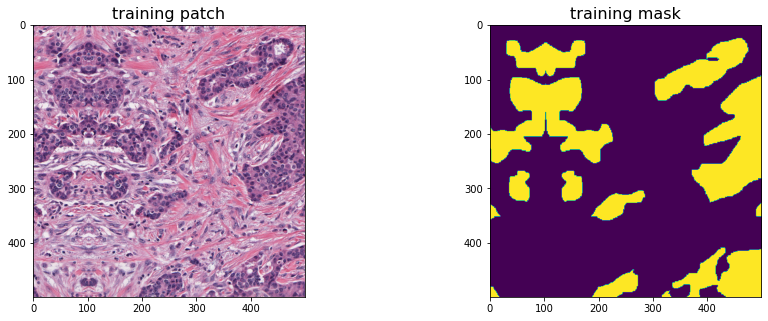

In [ ]:
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,2,1)
i = random.randint(0, len(train_table.root.img)-1) # randomly select a patch
img = train_table.root.img[i]
ax.set_title('training patch', fontsize = 16)
ax.imshow(img)

ax = fig.add_subplot(1,2,2)
mask = train_table.root.mask[i]
ax.imshow(mask)
ax.set_title('training mask', fontsize = 16)
fig

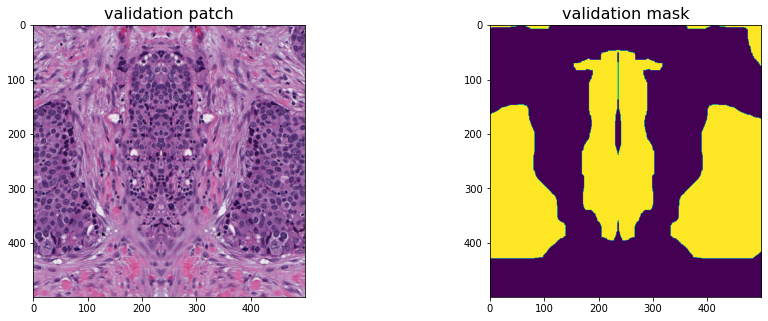

In [13]:
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,2,1)
i = random.randint(0, len(val_table.root.img)-1) # randomly select a patch
img = val_table.root.img[i]
ax.set_title('validation patch', fontsize = 16)
ax.imshow(img)

ax = fig.add_subplot(1,2,2)
mask = val_table.root.mask[i]
ax.imshow(mask)
ax.set_title('validation mask', fontsize = 16)
fig

Now let's apply transformations to see if we have the right masks for the 256 x 256 x 3 patches which the unet will be trained on.

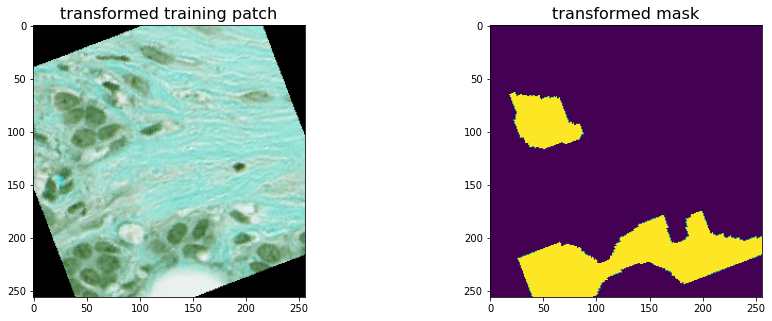

In [ ]:
seed = random.randrange(sys.maxsize)
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,2,1)
torch.manual_seed(seed)
img = train_table.root.img[i]
patch = img_transform(img)
patch_new = np.moveaxis(patch.numpy(),0,-1)
ax.set_title('transformed training patch', fontsize = 16)
ax.imshow(patch_new)

ax = fig.add_subplot(1,2,2)
torch.manual_seed(seed)
mask = train_table.root.mask[i]
mask_new = mask_transform(mask)
ax.set_title('transformed mask', fontsize = 16)
ax.imshow(mask_new)
fig

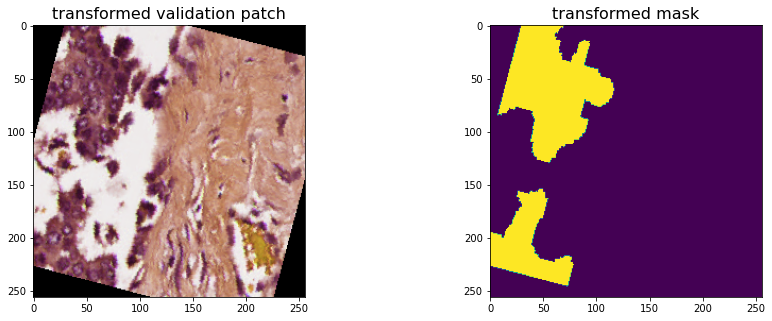

In [ ]:
seed = random.randrange(sys.maxsize)
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,2,1)
torch.manual_seed(seed)
img = val_table.root.img[i]
patch = img_transform(img)
patch_new = np.moveaxis(patch.numpy(),0,-1)
ax.set_title('transformed validation patch', fontsize = 16)
ax.imshow(patch_new)

ax = fig.add_subplot(1,2,2)
torch.manual_seed(seed)
mask = val_table.root.mask[i]
mask_new = mask_transform(mask)
ax.set_title('transformed mask', fontsize = 16)
ax.imshow(mask_new)
fig

In [17]:
dataset={}
dataLoader={}
for phase in phases: #now for each of the phases, create the dataloader    
    dataset[phase]=Dataset(f"./{dataname}_{phase}.pytable", img_transform=img_transform , mask_transform = mask_transform )
    dataLoader[phase]=DataLoader(dataset[phase], batch_size=batch_size, 
                                shuffle=True, num_workers=2, pin_memory=True) 

One last check to ascertain that the training and validation patches have the right masks

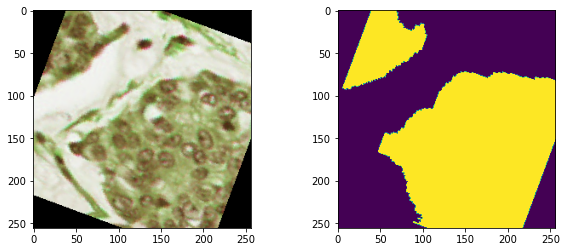

In [ ]:
i = random.randint(0, dataset["train"].nitems-1) # randomly select a patch
(img,patch_mask)=dataset["train"][i]
fig, ax = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns

ax[0].imshow(np.moveaxis(img.numpy(),0,-1))
ax[1].imshow(patch_mask)

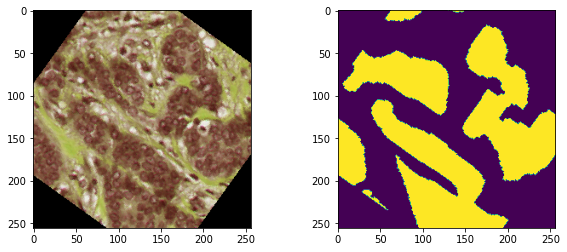

In [ ]:
i = random.randint(0, dataset["val"].nitems-1) # randomly select a patch
(img,patch_mask)=dataset["val"][i]
fig, ax = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns

ax[0].imshow(np.moveaxis(img.numpy(),0,-1))
ax[1].imshow(patch_mask)

In [ ]:
optim = torch.optim.Adam(model.parameters())

In [ ]:
#we have the ability to weight individual classes, in this case we'll do so based on their presense in the training set
#to avoid biasing any particular class
nclasses = dataset["train"].numpixels.shape[1]
class_weight=dataset["train"].numpixels[1] #don't take ignored class into account here
print(f'fraction of pixels (class 0) = {round(class_weight[0]/class_weight.sum(),3)}, \
fraction of pixels (class 1) = {round(class_weight[1]/class_weight.sum(),3)}')
class_weight = torch.from_numpy(1-class_weight/class_weight.sum()).type('torch.FloatTensor').to(device)

w0 = class_weight.cpu().numpy()[0]
w1 = class_weight.cpu().numpy()[1]
print('class weight (class 0) = ', round(w0,3), 'class weight (class 1) = ', round(w1,3)) #show final used weights, make sure that they're reasonable before continuing
criterion = nn.CrossEntropyLoss(weight = class_weight ,reduction=None) #reduce = None makes sure we get a 2D output instead of a 1D "summary" value

fraction of pixels (class 0) = 0.667, fraction of pixels (class 1) = 0.333
class weight (class 0) =  0.333 class weight (class 1) =  0.667


In [ ]:
writer=SummaryWriter() #open the tensorboard visualiser
best_loss_on_test = np.Infinity
start_time = time.time()
for epoch in range(num_epochs):
    #zero out epoch based performance variables 
    all_acc = {key: 0 for key in phases} 
    all_loss = {key: torch.zeros(0).to(device) for key in phases}
    cmatrix = {key: np.zeros((2,2)) for key in phases}

    phase = 'train'
    model.train()

    for ii , (X, y) in enumerate(dataLoader[phase]): #for each of the batches
        X = X.to(device)  # [Nbatch, 3, H, W]
        y = y.type('torch.LongTensor').to(device)  # [Nbatch, H, W] with class indices (0, 1)

        torch.set_grad_enabled(True)
        prediction = model(X)  # [Nbatch, Nclass, H, W]
        loss_matrix = criterion(prediction, y)
        loss = (loss_matrix).mean()

        optim.zero_grad()
        loss.backward()
        optim.step()

        all_loss[phase]=torch.cat((all_loss[phase],loss.detach().view(1,-1)))
        
    all_acc[phase]=(cmatrix[phase]/cmatrix[phase].sum()).trace()
    all_loss[phase] = all_loss[phase].cpu().numpy().mean()
    writer.add_scalar(f'{phase}/loss', all_loss[phase], epoch)

    phase = 'val'
    model.eval()

    for ii , (X, y) in enumerate(dataLoader[phase]): #for each of the batches
        X = X.to(device)  # [Nbatch, 3, H, W]
        y = y.type('torch.LongTensor').to(device)  # [Nbatch, H, W] with class indices (0, 1)

        torch.set_grad_enabled(True)
        prediction = model(X)  # [Nbatch, Nclass, H, W]
        loss_matrix = criterion(prediction, y)
        loss = (loss_matrix).mean()

        all_loss[phase]=torch.cat((all_loss[phase],loss.detach().view(1,-1)))

        p=prediction[:,:,:,:].detach().cpu().numpy()
        cpredflat=np.argmax(p,axis=1).flatten()
        yflat=y.cpu().numpy().flatten()

        cmatrix[phase]=cmatrix[phase]+confusion_matrix(yflat,cpredflat,labels=range(n_classes))

    all_acc[phase]=(cmatrix[phase]/cmatrix[phase].sum()).trace()
    all_loss[phase] = all_loss[phase].cpu().numpy().mean()

    writer.add_scalar(f'{phase}/acc', all_acc[phase], epoch)
    writer.add_scalar(f'{phase}/TN', cmatrix[phase][0,0], epoch)
    writer.add_scalar(f'{phase}/TP', cmatrix[phase][1,1], epoch)
    writer.add_scalar(f'{phase}/FP', cmatrix[phase][0,1], epoch)
    writer.add_scalar(f'{phase}/FN', cmatrix[phase][1,0], epoch)
    writer.add_scalar(f'{phase}/TNR', cmatrix[phase][0,0]/(cmatrix[phase][0,0]+cmatrix[phase][0,1]), epoch)
    writer.add_scalar(f'{phase}/TPR', cmatrix[phase][1,1]/(cmatrix[phase][1,1]+cmatrix[phase][1,0]), epoch)

    print('%s ([%d/%d] %d%%), train loss: %.4f test loss: %.4f' % (timeSince(start_time, (epoch+1) / num_epochs), epoch+1, num_epochs ,(epoch+1) / num_epochs * 100, all_loss["train"], all_loss["val"]),end="")    

    #if current loss is the best we've seen, save model state with all variables
    #necessary for recreation
    if all_loss["val"] < best_loss_on_test:
        best_loss_on_test = all_loss["val"]
        print("  **")
        state = {'epoch': epoch + 1,
         'model_dict': model.state_dict(),
         'optim_dict': optim.state_dict(),
         'best_loss_on_test': all_loss,
         'n_classes': n_classes,
         'in_channels': in_channels,
         'padding': padding,
         'depth': depth,
         'wf': wf,
         'up_mode': up_mode, 'batch_norm': batch_norm}


        torch.save(state, f"{dataname}_unet_best_model.pth")
    else:
        print("")

# Visualize predictions

In [14]:
cwd = os.getcwd()
checkpoint = torch.load(f"{cwd}/save/{dataname}_unet_best_model.pth")
model.load_state_dict(checkpoint["model_dict"])

<All keys matched successfully>

In [15]:
model = UNet(n_classes=checkpoint["n_classes"], in_channels=checkpoint["in_channels"],
             padding=checkpoint["padding"], depth=checkpoint["depth"], wf=checkpoint["wf"],
             up_mode=checkpoint["up_mode"], batch_norm=checkpoint["batch_norm"]).to(device)
model.load_state_dict(checkpoint["model_dict"])
model.eval();

Let's first look at a validation patch (256 x 256 x 3)

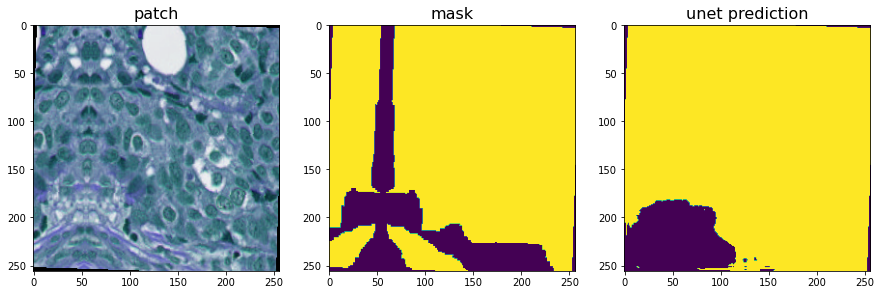

In [18]:
fig = Figure(figsize=(15,5))
ax = fig.add_subplot(1,3,1)
train_or_val = 'val'
i = random.randint(0, dataset[train_or_val].nitems - 1) # randomly select a patch
(img, patch_mask)=dataset[train_or_val][i]
ax.set_title('patch', fontsize = 16)
ax.imshow(np.moveaxis(img.numpy(),0,-1))

ax = fig.add_subplot(1,3,2)
ax.imshow(patch_mask)
ax.set_title('mask', fontsize = 16)

img_tf = torch.tensor(np.expand_dims(img,axis=0))
X = img_tf.to(device)
prediction = model(X.float())
p=prediction[:,:,:,:].detach().cpu().numpy()
cpredflat=np.argmax(p,axis=1)

ax = fig.add_subplot(1,3,3)
ax.imshow(cpredflat[0,:,:])
ax.set_title('unet prediction', fontsize = 16)
fig

Now let's take a look at a whole slide validation image (1000 x 1000 x 3)

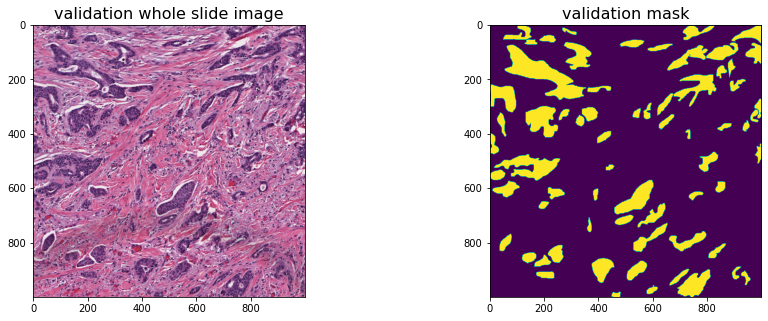

In [27]:
i = random.randint(0, val_table.root.filename.shape[0] - 1) # randomly select a patch
mask = val_table.root.filename[i].decode("utf-8")
image_id = re.search(r'(\d+)\_(\d+)', mask).group()
original = f'/content/drive/MyDrive/dl_tutorial/epithelium/epi/original/{image_id}.tif'
raw_img=cv2.cvtColor(cv2.imread(original),cv2.COLOR_BGR2RGB)
fig = Figure(figsize=(15,5))

ax = fig.add_subplot(1,2,1)
ax.set_title('validation whole slide image', fontsize = 16)
ax.imshow(raw_img)

mask_img=cv2.imread(mask, cv2.IMREAD_GRAYSCALE)
ax = fig.add_subplot(1,2,2)
ax.set_title('validation mask', fontsize = 16)
ax.imshow(mask_img)
fig

In [28]:
resize = 1
patch_size = 256
stride_size = patch_size//2

In [29]:
io = np.pad(raw_img, [(stride_size//2, stride_size//2), (stride_size//2, stride_size//2), (0, 0)], mode="reflect")
io_shape_wpad = np.array(io.shape)
npad0 = int(np.ceil(io_shape_wpad[0] / patch_size) * patch_size - io_shape_wpad[0])
npad1 = int(np.ceil(io_shape_wpad[1] / patch_size) * patch_size - io_shape_wpad[1])

io = np.pad(io, [(0, npad0), (0, npad1), (0, 0)], mode="constant")
io.shape

(1280, 1280, 3)

In [30]:
ntiles = (io.shape[0]//stride_size) - 1
segmentations_patches = np.zeros((ntiles, ntiles, patch_size, patch_size))
for x in range(ntiles):
  start_x = x*stride_size
  for y in range(ntiles):
    #print(start, start+patch_size)
    start_y = y*stride_size
    patches = io[start_x:start_x+patch_size, start_y:start_y+patch_size, :] 
    patches_tf = torch.tensor(np.expand_dims(patches,axis=0).transpose(0,3,1,2)/255)
    X = patches_tf.to(device)
    prediction = model(X.float())
    p=prediction[:,:,:,:].detach().cpu().numpy()
    cpredflat=np.argmax(p,axis=1)
    segmentations_patches[x,y,:,:] = cpredflat[0,:,:]

In [32]:
segmentations_whole_slide = np.zeros((io.shape[0],io.shape[1]))
for x in range(ntiles):
  start_x = x*stride_size
  for y in range(ntiles):
    start_y = y*stride_size
    segmentations_whole_slide[start_x:start_x+patch_size, start_y:start_y+patch_size] += segmentations_patches[x,y]

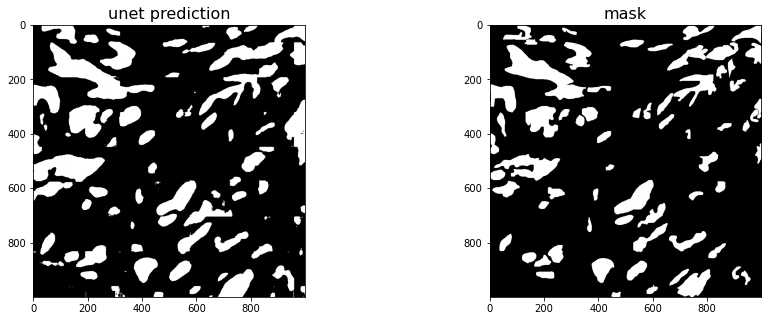

In [33]:
fig = Figure(figsize=(15,5))

ax = fig.add_subplot(1,2,1)
out = np.zeros_like(mask_img)
x0 = stride_size//2
x1 = x0 + mask_img.shape[0]
y0 = stride_size//2
y1 = y0 + mask_img.shape[1]
out = segmentations_whole_slide[x0: x1, y0: y1]
out = np.where(out >= 1, 1, 0)
ax.imshow(out, cmap='Greys_r')
ax.set_title('unet prediction',fontsize=16)

ax = fig.add_subplot(1,2,2)
ax.imshow(mask_img,  cmap='Greys_r')
ax.set_title('mask',fontsize=16)

fig

In [34]:
dice = np.sum(out[mask_img/255==1])*2.0 / (np.sum(out) + np.sum(mask_img//255))
print('prediction metric (Dice score) = ', round(dice,2))

prediction metric (Dice score) =  0.81


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>